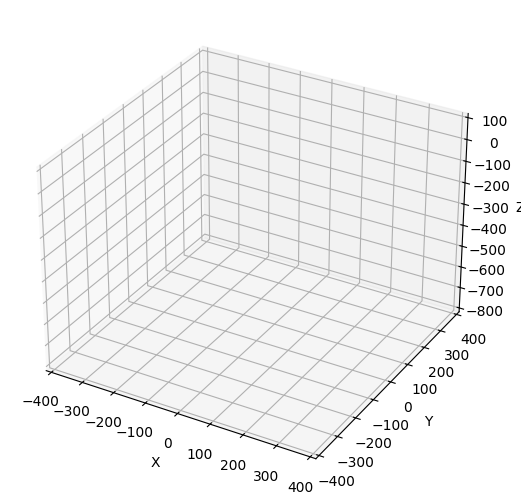

In [2]:
from stl import mesh
from mpl_toolkits import mplot3d
from matplotlib import pyplot as plt, animation
import numpy as np
from IPython.display import HTML

# Create a new plot
figure = plt.figure()
axes = mplot3d.Axes3D(figure)
figure.add_axes(axes)

# Load the STL files and add the vectors to the plot
mesh_data1 = mesh.Mesh.from_file("cylinder.stl")
midPosRel1 = (mesh_data1.max_ - mesh_data1.min_) / 2
mesh_data1.x = mesh_data1.x - (midPosRel1[0] + mesh_data1.min_[0])
mesh_data1.y = mesh_data1.y - (midPosRel1[1] + mesh_data1.min_[1])
mesh_data1.z = mesh_data1.z - mesh_data1.min_[2]

mesh_data2 = mesh.Mesh.from_file("cylinder.stl")
midPosRel2 = (mesh_data2.max_ - mesh_data2.min_) / 2
mesh_data2.x = mesh_data2.x - (midPosRel2[0] + mesh_data2.min_[0])
mesh_data2.y = mesh_data2.y - (midPosRel2[1] + mesh_data2.min_[1])
mesh_data2.z = mesh_data2.z - mesh_data2.min_[2]


# 原点を中心に180度回転
mesh_data1.rotate([0.0, 1.0, 0.0], np.radians(180))

xmin, xmax = -400, 400
ymin, ymax = -400, 400
zmin, zmax = -800, 100
axes.set_xlim3d(xmin, xmax)


axes.set_xlabel("X")
axes.set_ylim3d(ymin, ymax)
axes.set_ylabel("Y")
axes.set_zlim3d(zmin, zmax)
axes.set_zlabel("Z")



def update(angle: float):
    axes.cla()
    axes.set_xlim3d(xmin, xmax)
    axes.set_xlabel("X")
    axes.set_ylim3d(ymin, ymax)
    axes.set_ylabel("Y")
    axes.set_zlim3d(zmin, zmax)
    axes.set_zlabel("Z")
    mesh_data1.rotate([0.0, 1.0, 0.0], np.radians(angle))
    axes.add_collection3d(mplot3d.art3d.Poly3DCollection(mesh_data1.vectors))
    mesh_data1.rotate([0.0, 1.0, 0.0], np.radians(-1 * angle))



In [3]:
import scipy.integrate as RK45
import numpy as np

t_0 = 0
omega_0 = 0
theta_0 = np.pi / 4

a = 0.36
m = 0.50
g = 9.8
Iz = m * 0.03 * a

t_max = 10

init = np.array([omega_0, theta_0])
t_span = (t_0, t_max)
t_eval = np.linspace(t_0, t_max, t_max * 10)


def func(t, Y):
    (omega, theta) = Y

    def omega_t(t, omega, theta):
        return (-a * m * g) / (Iz + m * a**2) * np.sin(theta)

    def tueta_t(t, omega, theta):
        return omega

    return np.array([omega_t(t, omega, theta), tueta_t(t, omega, theta)])


sol = RK45.solve_ivp(func, t_span, init, t_eval=t_eval)

thetas = sol.y[1] * 180 / np.pi

In [4]:
anim = animation.FuncAnimation(figure, update, frames=thetas, interval=100)
HTML(anim.to_jshtml())